Group 1

Case Study: heart Arrhythmia

Data Set  : https://archive.ics.uci.edu/ml/machine-learning-databases/arrhythmia/arrhythmia.data

Member    :
*   Brillian Adhiyaksa K (1202201375)





---

## Import Library

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Import Data

In [ ]:
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/arrhythmia/arrhythmia.data', header=None)

## Preprocessing

### shape

In [ ]:
row, column = df.shape
print(f'data ini memiliki {row} baris dan {column} column')

data ini memiliki 452 baris dan 280 column


### drop data 264 data

In [ ]:
df.drop([x for x in range(15,279)],axis=1, inplace=True)


### rename column

In [ ]:
name = ['Age', 'Sex', 'Height', 'Weight', 'QRS duration', 'P-R interval', 'Q-T interval', 'T interval', 'P interval', 'QRS',
                         'T', 'P', 'QRST', 'J', 'Heart rate', 'diagnosis']

In [ ]:
df.columns = name

In [ ]:
df[df['diagnosis'] == 1].describe()

,Age,Sex,Height,Weight,QRS duration,P-R interval,Q-T interval,T interval,P interval,QRS,diagnosis
count,245.000000,245.000000,245.000000,245.000000,245.000000,245.000000,245.000000,245.000000,245.000000,245.000000,245.0
mean,46.273469,0.653061,164.102041,68.669388,84.277551,157.216327,367.200000,162.918367,92.232653,36.787755,1.0
std,14.556092,0.476970,8.048126,14.454595,8.735439,44.745159,26.458845,24.326533,23.395542,36.108725,0.0
min,9.000000,0.000000,132.000000,18.000000,55.000000,0.000000,241.000000,111.000000,0.000000,-58.000000,1.0
25%,36.000000,0.000000,160.000000,58.000000,78.000000,140.000000,353.000000,148.000000,79.000000,12.000000,1.0
50%,46.000000,1.000000,163.000000,68.000000,84.000000,156.000000,367.000000,160.000000,91.000000,41.000000,1.0
75%,57.000000,1.000000,170.000000,78.000000,90.000000,173.000000,383.000000,172.000000,103.000000,66.000000,1.0
max,83.000000,1.000000,186.000000,124.000000,113.000000,524.000000,450.000000,292.000000,205.000000,169.000000,1.0


In [ ]:
df.head()

,Age,Sex,Height,Weight,QRS duration,P-R interval,Q-T interval,T interval,P interval,QRS,T,P,QRST,J,Heart rate,diagnosis
0,75,0,190,80,91,193,371,174,121,-16,13,64,-2,?,63,8
1,56,1,165,64,81,174,401,149,39,25,37,-17,31,?,53,6
2,54,0,172,95,138,163,386,185,102,96,34,70,66,23,75,10
3,55,0,175,94,100,202,380,179,143,28,11,-5,20,?,71,1
4,75,0,190,80,88,181,360,177,103,-16,13,61,3,?,?,7


### noisy data

In [ ]:
df[df['Height'] > 200]

,Age,Sex,Height,Weight,QRS duration,P-R interval,Q-T interval,T interval,P interval,QRS,T,P,QRST,J,Heart rate,diagnosis
141,1,1,780,6,85,165,237,150,106,88,30,30,52,?,138,5
316,0,0,608,10,83,126,232,128,60,125,21,-50,102,?,163,5


In [ ]:
df.loc[df["Height"] == 608, "Height"] = 61
df.loc[df["Height"] == 780, "Height"] = 78

#### Wrong data type and Missing Value handling

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452 entries, 0 to 451
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Age           452 non-null    int64 
 1   Sex           452 non-null    int64 
 2   Height        452 non-null    int64 
 3   Weight        452 non-null    int64 
 4   QRS duration  452 non-null    int64 
 5   P-R interval  452 non-null    int64 
 6   Q-T interval  452 non-null    int64 
 7   T interval    452 non-null    int64 
 8   P interval    452 non-null    int64 
 9   QRS           452 non-null    int64 
 10  T             452 non-null    object
 11  P             452 non-null    object
 12  QRST          452 non-null    object
 13  J             452 non-null    object
 14  Heart rate    452 non-null    object
 15  diagnosis     452 non-null    int64 
dtypes: int64(11), object(5)
memory usage: 56.6+ KB


In [ ]:
def nan(data):
  if data == '?':
    return np.nan
  else:
    return data

In [ ]:
df['T'] = df['T'].apply(nan)
df['T'] = df['T'].apply(pd.to_numeric)

df['P'] = df['P'].apply(nan)
df['P'] = df['P'].apply(pd.to_numeric)

df['QRST'] = df['QRST'].apply(nan)
df['QRST'] = df['QRST'].apply(pd.to_numeric)

df['J'] = df['J'].apply(nan)
df['J'] = df['J'].apply(pd.to_numeric)

df['Heart rate'] = df['Heart rate'].apply(nan)
df['Heart rate'] = df['Heart rate'].apply(pd.to_numeric)

In [ ]:
df.isna().sum()

Age               0
Sex               0
Height            0
Weight            0
QRS duration      0
P-R interval      0
Q-T interval      0
T interval        0
P interval        0
QRS               0
T                 8
P                22
QRST              1
J               376
Heart rate        1
diagnosis         0
dtype: int64

In [ ]:
df.drop('J',axis=1, inplace=True) # drop J because so many NaN

In [ ]:
df.isna().sum()

Age              0
Sex              0
Height           0
Weight           0
QRS duration     0
P-R interval     0
Q-T interval     0
T interval       0
P interval       0
QRS              0
T                8
P               22
QRST             1
Heart rate       1
diagnosis        0
dtype: int64

#### fillna with mean

In [ ]:
df['T'].fillna(value=df['T'].mean(), inplace=True)
df['P'].fillna(value=df['P'].mean(), inplace=True)
df['QRST'].fillna(value=df['QRST'].mean(), inplace=True)
df['Heart rate'].fillna(value=df['Heart rate'].mean(), inplace=True)

In [ ]:
df['T'] = df['T'].astype(int)
df['P'] = df['P'].astype(int)
df['QRST'] = df['QRST'].astype(int)
df['Heart rate'] = df['Heart rate'].astype(int)

#### result

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452 entries, 0 to 451
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   Age           452 non-null    int64
 1   Sex           452 non-null    int64
 2   Height        452 non-null    int64
 3   Weight        452 non-null    int64
 4   QRS duration  452 non-null    int64
 5   P-R interval  452 non-null    int64
 6   Q-T interval  452 non-null    int64
 7   T interval    452 non-null    int64
 8   P interval    452 non-null    int64
 9   QRS           452 non-null    int64
 10  T             452 non-null    int64
 11  P             452 non-null    int64
 12  QRST          452 non-null    int64
 13  Heart rate    452 non-null    int64
 14  diagnosis     452 non-null    int64
dtypes: int64(15)
memory usage: 53.1 KB


In [ ]:
df.isna().sum()

Age             0
Sex             0
Height          0
Weight          0
QRS duration    0
P-R interval    0
Q-T interval    0
T interval      0
P interval      0
QRS             0
T               0
P               0
QRST            0
Heart rate      0
diagnosis       0
dtype: int64

### info

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452 entries, 0 to 451
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   Age           452 non-null    int64
 1   Sex           452 non-null    int64
 2   Height        452 non-null    int64
 3   Weight        452 non-null    int64
 4   QRS duration  452 non-null    int64
 5   P-R interval  452 non-null    int64
 6   Q-T interval  452 non-null    int64
 7   T interval    452 non-null    int64
 8   P interval    452 non-null    int64
 9   QRS           452 non-null    int64
 10  T             452 non-null    int64
 11  P             452 non-null    int64
 12  QRST          452 non-null    int64
 13  Heart rate    452 non-null    int64
 14  diagnosis     452 non-null    int64
dtypes: int64(15)
memory usage: 53.1 KB


In [ ]:
df.describe()

,Age,Sex,Height,Weight,QRS duration,P-R interval,Q-T interval,T interval,P interval,QRS,T,P,QRST,Heart rate,diagnosis
count,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000,452.000000
mean,46.471239,0.550885,163.424779,68.170354,88.920354,155.152655,367.207965,169.949115,90.004425,33.676991,36.148230,48.869469,36.714602,74.462389,3.880531
std,16.466631,0.497955,12.146961,16.590803,15.364394,44.842283,33.385421,35.633072,25.826643,45.431434,57.342807,28.622371,35.980784,13.855315,4.407097
min,0.000000,0.000000,61.000000,6.000000,55.000000,0.000000,232.000000,108.000000,0.000000,-172.000000,-177.000000,-170.000000,-135.000000,44.000000,1.000000
25%,36.000000,0.000000,160.000000,59.000000,80.000000,142.000000,350.000000,148.000000,79.000000,3.750000,14.000000,41.000000,12.000000,65.000000,1.000000
50%,47.000000,1.000000,164.000000,68.000000,86.000000,157.000000,367.000000,162.000000,91.000000,40.000000,41.000000,54.500000,40.000000,72.000000,1.000000
75%,58.000000,1.000000,170.000000,79.000000,94.000000,175.000000,384.000000,179.000000,102.000000,66.000000,63.000000,64.000000,62.000000,81.000000,6.000000
max,83.000000,1.000000,190.000000,176.000000,188.000000,524.000000,509.000000,381.000000,205.000000,169.000000,179.000000,176.000000,166.000000,163.000000,16.000000


In [ ]:
df.mode()

,Age,Sex,Height,Weight,QRS duration,P-R interval,Q-T interval,T interval,P interval,QRS,T,P,QRST,Heart rate,diagnosis
0,46.0,1.0,160.0,70.0,78,0.0,357.0,152.0,100.0,62.0,36.0,48.0,49.0,63.0,1.0
1,NaN,NaN,NaN,80.0,80,NaN,364.0,NaN,NaN,66.0,NaN,NaN,55.0,72.0,NaN
2,NaN,NaN,NaN,NaN,82,NaN,383.0,NaN,NaN,NaN,NaN,NaN,59.0,NaN,NaN
3,NaN,NaN,NaN,NaN,85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.0,NaN,NaN
4,NaN,NaN,NaN,NaN,90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.head()

,Age,Sex,Height,Weight,QRS duration,P-R interval,Q-T interval,T interval,P interval,QRS,T,P,QRST,Heart rate,diagnosis
0,75,0,190,80,91,193,371,174,121,-16,13,64,-2,63,8
1,56,1,165,64,81,174,401,149,39,25,37,-17,31,53,6
2,54,0,172,95,138,163,386,185,102,96,34,70,66,75,10
3,55,0,175,94,100,202,380,179,143,28,11,-5,20,71,1
4,75,0,190,80,88,181,360,177,103,-16,13,61,3,74,7


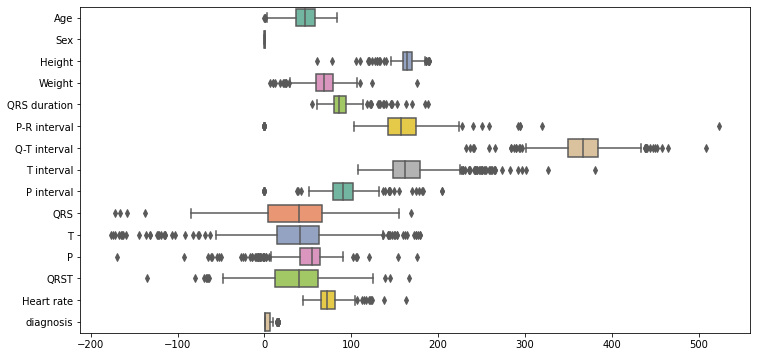

In [ ]:
plt.figure(figsize=(12, 6))
ax = sns.boxplot(data=df, orient="h", palette="Set2")
plt.show()

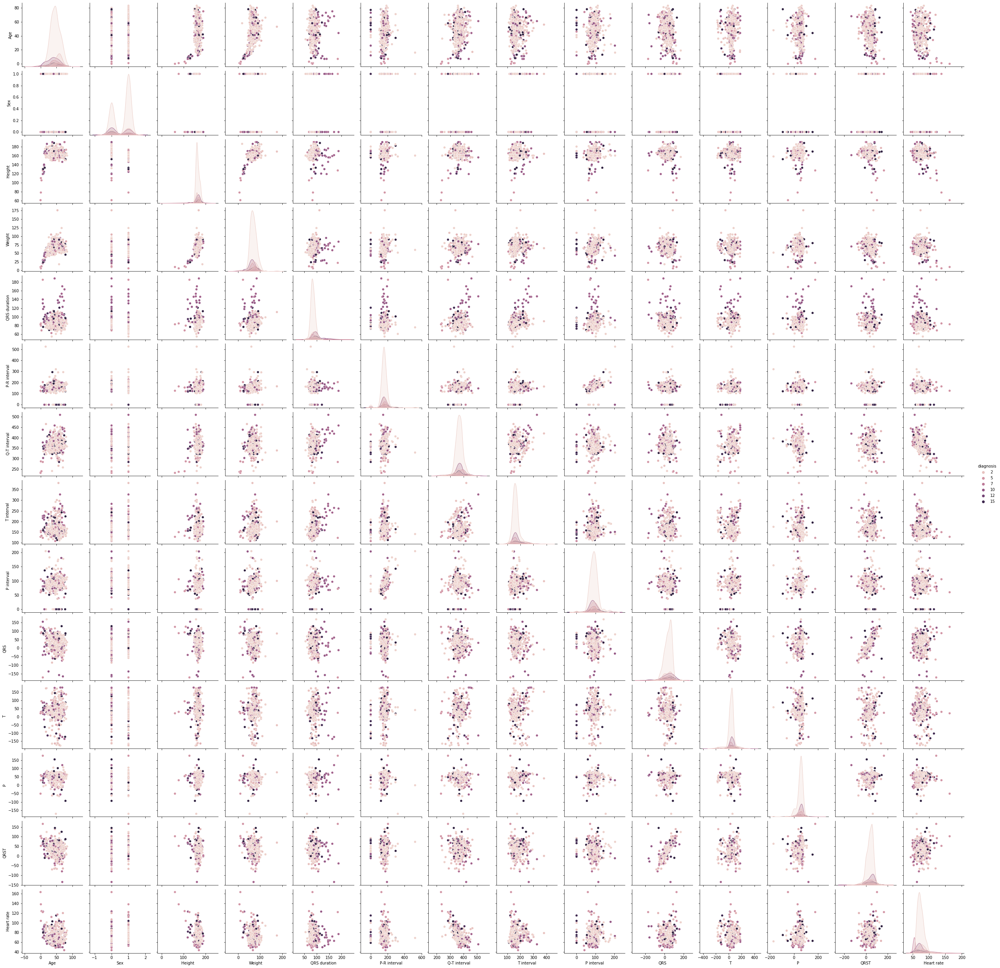

In [ ]:
sns.color_palette("bright")
sns.pairplot(df, hue='diagnosis')  
plt.show()

#### pie chart

In [ ]:
colors = sns.color_palette('pastel')[0:5]

data = df['diagnosis'].value_counts()
data
data = data.to_list()
bucket = []
tumbal = 0
for i in data:
  if i > 10:
    bucket.append(i)
  else:
    tumbal += i
bucket.append(tumbal)

label = ['1','10','2','6','16','3','4','5','other']
pie = pd.DataFrame(label, columns =['diagnosis'])
pie['jumlah'] = bucket
pie

,diagnosis,jumlah
0,1,245
1,10,50
2,2,44
3,6,25
4,16,22
5,3,15
6,4,15
7,5,13
8,other,23


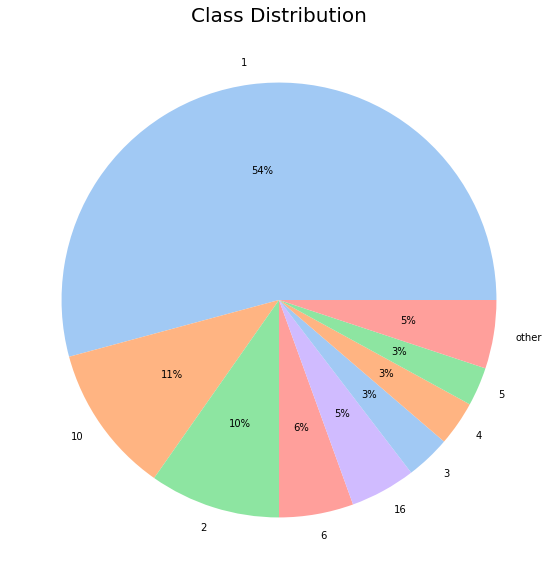

In [ ]:
plt.figure(figsize=(10,10))
colors = sns.color_palette('pastel')[0:5]
plt.pie(pie['jumlah'], labels = pie['diagnosis'], colors = colors, autopct='%.0f%%')

plt.title("Class Distribution", fontsize=20)
plt.show()

## model not binary


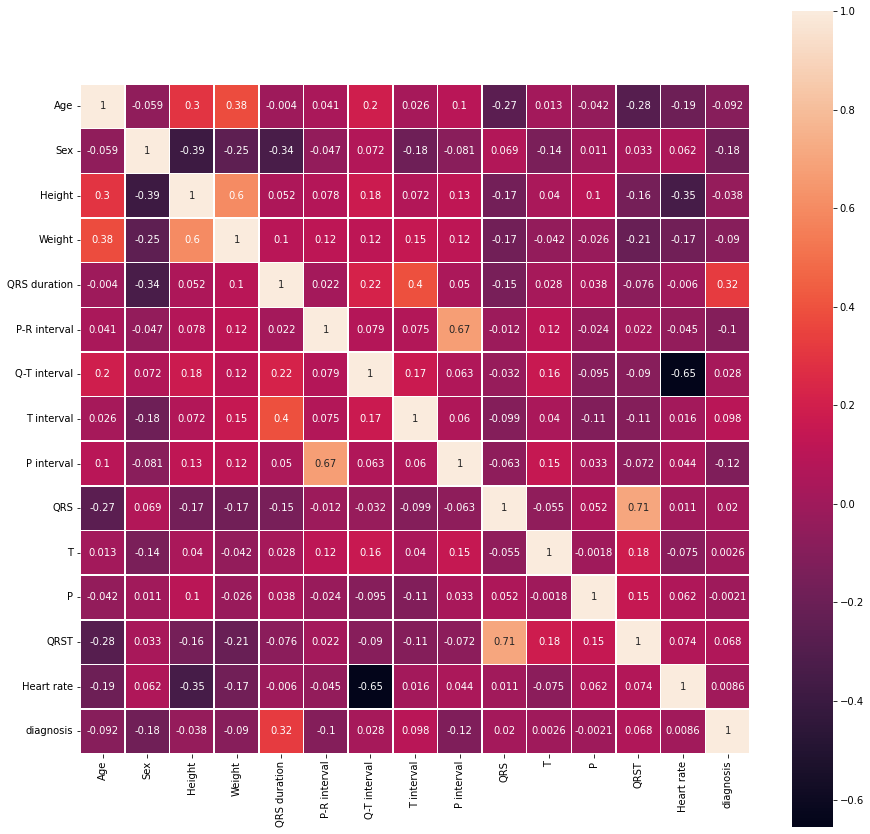

In [ ]:
corrmat = df.corr() # Correlation matrix.
f, ax = plt.subplots(figsize=(15, 15))
plt.xticks(rotation='90')
sns.heatmap(corrmat, square=True, linewidths=.5, annot=True)
plt.show()

#### split data

In [ ]:
#split dataset in features and target variable
X_model_1 = df.drop('diagnosis', axis=1, inplace=False) # Features
y_model_1 = df.diagnosis # Target variable

In [ ]:
# Split dataset into training set and test set
from sklearn.model_selection import train_test_split
X_train_model_1, X_test_model_1, y_train_model_1, y_test_model_1 = train_test_split(X_model_1, y_model_1, test_size=0.30, random_state=1234) # 70% training and 30% test

### Decision Tree

In [ ]:
!pip install --upgrade scikit-learn==0.20.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
from sklearn.tree import DecisionTreeClassifier

In [ ]:
import warnings
warnings.filterwarnings('ignore') 

In [ ]:
# Create Decision Tree classifer object
DCT = DecisionTreeClassifier()

# Train Decision Tree Classifer
DCT_model_1 = DCT.fit(X_train_model_1,y_train_model_1)

#Predict the response for test dataset
y_pred_model_1 = DCT_model_1.predict(X_test_model_1)

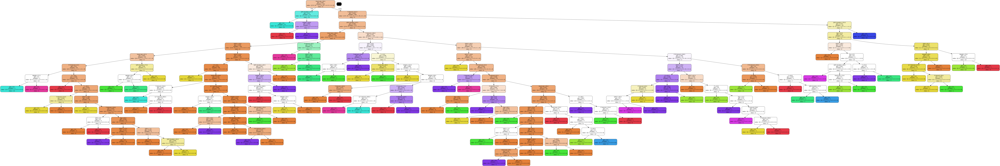

In [ ]:
DCT_model_1 = DCT.fit(X_train_model_1,y_train_model_1)

#Predict the response for test dataset
y_pred_model_1 = DCT_model_1.predict(X_test_model_1)

dot_data = StringIO()
export_graphviz(DCT_model_1, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names = X_model_1.columns,
                class_names= ' '.join(map(str, df['diagnosis'].unique())).split(' '))

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('classification 1.png')
Image(graph.create_png())

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, accuracy_score

In [ ]:
print("Classification Report : \n",classification_report(y_test_model_1, y_pred_model_1))
print("Accuracy :", accuracy_score(y_test_model_1, y_pred_model_1) * 100)
print("Cohen Kappa :", cohen_kappa_score(y_test_model_1, y_pred_model_1))

Classification Report : 
               precision    recall  f1-score   support

           1       0.75      0.72      0.74        72
           2       0.21      0.33      0.26         9
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         4
           5       0.43      1.00      0.60         3
           6       0.70      0.78      0.74         9
           7       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         2
           9       0.80      0.80      0.80         5
          10       0.38      0.38      0.38        13
          14       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         0
          16       0.00      0.00      0.00         9

   micro avg       0.54      0.54      0.54       136
   macro avg       0.25      0.31      0.27       136
weighted avg       0.54      0.54      0.54       136

Accuracy : 54.41176470588235
Cohen Kappa : 0.35158412

#### fine tuning


In [ ]:
from  sklearn.model_selection import GridSearchCV

In [ ]:
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]}

In [ ]:
# params = {'max_leaf_nodes': list(range(2, 100)), 'min_samples_split': list(range(2, 50))}
# DCT_gs_model_1 = GridSearchCV(DecisionTreeClassifier(random_state=1234), params, verbose=1, cv=5,  n_jobs=-1)
DCT_gs_model_1 = GridSearchCV(estimator=DecisionTreeClassifier(random_state=1234), 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")
DCT_gs_model_1.fit(X_train_model_1,y_train_model_1)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    2.6s finished


GridSearchCV(cv=4, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=1234,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [2, 3, 5, 10, 20], 'min_samples_leaf': [5, 10, 20, 50, 100], 'criterion': ['gini', 'entropy']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=1)

In [ ]:
DCT_gs_model_1.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=2,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=20, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=1234,
            splitter='best')

In [ ]:
y_pred_model_1 = DCT_gs_model_1.predict(X_test_model_1)

In [ ]:
print("Classification Report : \n",classification_report(y_test_model_1, y_pred_model_1))
print("Accuracy :", round(accuracy_score(y_test_model_1, y_pred_model_1) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test_model_1, y_pred_model_1),2))

Classification Report : 
               precision    recall  f1-score   support

           1       0.57      0.96      0.72        72
           2       0.00      0.00      0.00         9
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         3
           6       0.60      1.00      0.75         9
           7       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         2
           9       0.00      0.00      0.00         5
          10       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         1
          16       0.00      0.00      0.00         9

   micro avg       0.57      0.57      0.57       136
   macro avg       0.10      0.16      0.12       136
weighted avg       0.34      0.57      0.43       136

Accuracy : 57.35
Cohen Kappa : 0.18


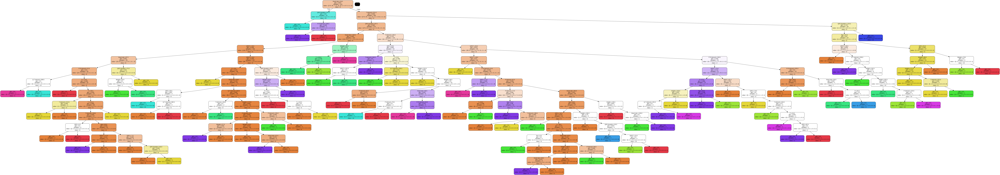

In [ ]:
DCT_gs_model_1 = DCT.fit(X_train_model_1,y_train_model_1)

#Predict the response for test dataset
y_pred_model_1 = DCT_gs_model_1.predict(X_test_model_1)

dot_data = StringIO()
export_graphviz(DCT_gs_model_1, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names = X_model_1.columns,
                class_names= ' '.join(map(str, df['diagnosis'].unique())).split(' '))

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('classification 1.1.png')
Image(graph.create_png())

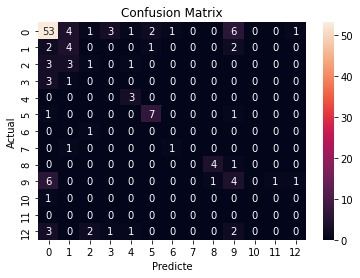

In [ ]:
cm = confusion_matrix(y_test_model_1, y_pred_model_1)
# print(cm)
sns.heatmap(cm, annot = True)
plt.xlabel("Predicte")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### validation

In [ ]:
df.head()

,Age,Sex,Height,Weight,QRS duration,P-R interval,Q-T interval,T interval,P interval,QRS,T,P,QRST,Heart rate,diagnosis
0,75,0,190,80,91,193,371,174,121,-16,13,64,-2,63,8
1,56,1,165,64,81,174,401,149,39,25,37,-17,31,53,6
2,54,0,172,95,138,163,386,185,102,96,34,70,66,75,10
3,55,0,175,94,100,202,380,179,143,28,11,-5,20,71,1
4,75,0,190,80,88,181,360,177,103,-16,13,61,3,74,7


In [ ]:
data_test = np.array([[54, 0, 172, 95, 138, 163, 386, 185, 102, 96, 34, 70, 66, 75]])
print((DCT_gs_model_1.predict(data_test)[0]))

data_test = np.array([[55, 0,	175, 94, 100, 202, 380, 179, 143, 28,	11,	-5,	20,	71]])
print((DCT_gs_model_1.predict(data_test)[0]))

10
1


### K Nearest-neighbor

In [ ]:
from sklearn.preprocessing import StandardScaler  
scaler = StandardScaler()  
scaler.fit(X_train_model_1)

X_train_model_1 = scaler.transform(X_train_model_1)  
X_test_model_1 = scaler.transform(X_test_model_1)

In [ ]:
#Import knearest neighbors Classifier model
from sklearn.neighbors import KNeighborsClassifier

#Create KNN Classifier
knn_model_1 = KNeighborsClassifier(n_neighbors=2)

#Train the model using the training sets
knn_model_1.fit(X_train_model_1, y_train_model_1)

#Predict the response for test dataset
y_pred_model_1 = knn_model_1.predict(X_test_model_1)

In [ ]:
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:", metrics.accuracy_score(y_test_model_1, y_pred_model_1))

Accuracy: 0.5808823529411765


In [ ]:
print("Classification Report : \n",classification_report(y_test_model_1, y_pred_model_1))
print("Accuracy :", round(accuracy_score(y_test_model_1, y_pred_model_1) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test_model_1, y_pred_model_1),2))

Classification Report : 
               precision    recall  f1-score   support

           1       0.61      0.96      0.75        72
           2       0.00      0.00      0.00         9
           3       0.50      0.12      0.20         8
           4       0.00      0.00      0.00         4
           5       1.00      0.67      0.80         3
           6       1.00      0.33      0.50         9
           7       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         2
           9       1.00      0.60      0.75         5
          10       0.25      0.08      0.12        13
          14       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         0
          16       0.00      0.00      0.00         9

   micro avg       0.58      0.58      0.58       136
   macro avg       0.34      0.21      0.24       136
weighted avg       0.50      0.58      0.50       136

Accuracy : 58.09
Cohen Kappa : 0.24


#### fine tuning

In [ ]:
error_model_1 = []

# Calculating error for K values between 1 and 100
for i in range(1, 40):  
    knn_model_1 = KNeighborsClassifier(n_neighbors=i)
    knn_model_1.fit(X_train_model_1, y_train_model_1)
    pred_i = knn_model_1.predict(X_test_model_1)
    error_model_1.append(np.mean(pred_i != y_test_model_1))

Text(0, 0.5, 'Error rata-rata')

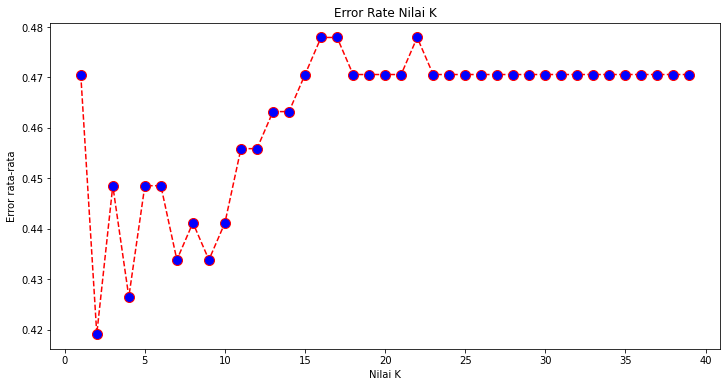

In [ ]:
plt.figure(figsize=(12, 6))  
plt.plot(range(1, 40), error_model_1, color='red', linestyle='dashed', marker='o',  
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate Nilai K')  
plt.xlabel('Nilai K')  
plt.ylabel('Error rata-rata')  

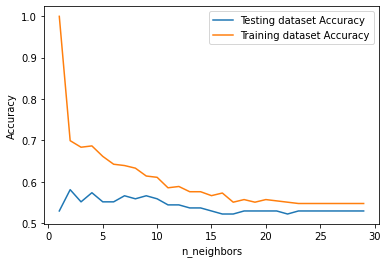

In [ ]:
neighbors = np.arange(1, 30)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
 
# Loop over K values
for i, k in enumerate(neighbors):
    knn_model_1 = KNeighborsClassifier(n_neighbors=k)
    knn_model_1.fit(X_train_model_1, y_train_model_1)
     
    # Compute training and test data accuracy
    train_accuracy[i] = knn_model_1.score(X_train_model_1, y_train_model_1)
    test_accuracy[i] = knn_model_1.score(X_test_model_1, y_test_model_1)
 
# Generate plot
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy')
 
plt.legend()
plt.xlabel('n_neighbors')
plt.ylabel('Accuracy')
plt.show()

### Naive Bayes

In [ ]:
#Import Gaussian Naive Bayes model
from sklearn.naive_bayes import GaussianNB

#Create a Gaussian Classifier
gnb_model_1 = GaussianNB()

#Train the model using the training sets
gnb_model_1.fit(X_train_model_1, y_train_model_1)

#Predict the response for test dataset
y_pred_model_1 = gnb_model_1.predict(X_test_model_1)

In [ ]:
print("Classification Report : \n",classification_report(y_test_model_1, y_pred_model_1))
print("Accuracy :", round(accuracy_score(y_test_model_1, y_pred_model_1) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test_model_1, y_pred_model_1),2))

Classification Report : 
               precision    recall  f1-score   support

           1       0.73      0.65      0.69        72
           2       0.11      0.11      0.11         9
           3       0.19      0.88      0.31         8
           4       0.00      0.00      0.00         4
           5       0.43      1.00      0.60         3
           6       0.40      0.22      0.29         9
           7       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         2
           9       1.00      0.60      0.75         5
          10       0.75      0.23      0.35        13
          14       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         0
          16       0.00      0.00      0.00         9

   micro avg       0.49      0.49      0.49       136
   macro avg       0.28      0.28      0.24       136
weighted avg       0.55      0.49      0.49       136

Accuracy : 48.53
Cohen Kappa : 0.29


#### fine tuning

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold

cv_method = RepeatedStratifiedKFold(n_splits=5, 
                                    n_repeats=3, 
                                    random_state=999)

In [ ]:
from sklearn.preprocessing import PowerTransformer
params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}

gs_NB_model_1 = GridSearchCV(estimator=gnb_model_1, 
                     param_grid=params_NB, 
                     cv=cv_method,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(X_test_model_1)

gs_NB_model_1.fit(Data_transformed, y_test_model_1);

Fitting 15 folds for each of 100 candidates, totalling 1500 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1500 out of 1500 | elapsed:    4.9s finished


In [ ]:
gs_NB_model_1.best_params_

{'var_smoothing': 0.8111308307896871}

In [ ]:
gs_NB_model_1.best_score_

0.5906862745098039

In [ ]:
y_pred_model_1 = gs_NB_model_1.predict(X_test_model_1)

In [ ]:
print("Classification Report : \n",classification_report(y_test_model_1, y_pred_model_1))
print("Accuracy :", round(accuracy_score(y_test_model_1, y_pred_model_1) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test_model_1, y_pred_model_1),2))

Classification Report : 
               precision    recall  f1-score   support

           1       0.77      0.92      0.84        72
           2       0.50      0.22      0.31         9
           3       0.55      0.75      0.63         8
           4       1.00      0.25      0.40         4
           5       1.00      1.00      1.00         3
           6       0.75      0.67      0.71         9
           7       0.33      1.00      0.50         1
           8       0.50      0.50      0.50         2
           9       0.71      1.00      0.83         5
          10       1.00      0.31      0.47        13
          14       1.00      1.00      1.00         1
          16       0.50      0.33      0.40         9

   micro avg       0.73      0.73      0.73       136
   macro avg       0.72      0.66      0.63       136
weighted avg       0.74      0.73      0.70       136

Accuracy : 72.79
Cohen Kappa : 0.58


### SVM

In [ ]:
#Import svm model
from sklearn import svm
from sklearn.svm import SVC

#Create a svm Classifier
clf_model_1 = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
clf_model_1.fit(X_train_model_1, y_train_model_1)

#Predict the response for test dataset
y_pred_model_1 = clf_model_1.predict(X_test_model_1)

In [ ]:
print("Classification Report : \n",classification_report(y_test_model_1, y_pred_model_1))
print("Accuracy :", round(accuracy_score(y_test_model_1, y_pred_model_1) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test_model_1, y_pred_model_1),2))

Classification Report : 
               precision    recall  f1-score   support

           1       0.68      0.93      0.79        72
           2       0.12      0.11      0.12         9
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         4
           5       0.60      1.00      0.75         3
           6       0.83      0.56      0.67         9
           7       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         2
           9       1.00      0.80      0.89         5
          10       0.40      0.15      0.22        13
          14       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         0
          16       0.00      0.00      0.00         9

   micro avg       0.60      0.60      0.60       136
   macro avg       0.28      0.27      0.26       136
weighted avg       0.51      0.60      0.54       136

Accuracy : 60.29
Cohen Kappa : 0.34


#### fine tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
 
# defining parameter range
param_grid = {
    'C' : [1000, 10000, 100000],
    'gamma' : [0.5, 0.05, 0.005],
    'kernel' : ['linear', 'poly', 'rbf', 'sigmoid']
    }
 
grid_model_1 = GridSearchCV(SVC(), param_grid, refit=True, verbose=3)
 
# fitting the model for grid search
grid_model_1.fit(X_train_model_1, y_train_model_1)

Fitting 3 folds for each of 36 candidates, totalling 108 fits
[CV] C=1000, gamma=0.5, kernel=linear ................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  C=1000, gamma=0.5, kernel=linear, score=0.4954954954954955, total=   5.4s
[CV] C=1000, gamma=0.5, kernel=linear ................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.4s remaining:    0.0s


[CV]  C=1000, gamma=0.5, kernel=linear, score=0.5142857142857142, total=   2.5s
[CV] C=1000, gamma=0.5, kernel=linear ................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    7.9s remaining:    0.0s


[CV] ..... C=1000, gamma=0.5, kernel=linear, score=0.61, total=   3.5s
[CV] C=1000, gamma=0.5, kernel=poly ..................................
[CV]  C=1000, gamma=0.5, kernel=poly, score=0.5225225225225225, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=poly ..................................
[CV]  C=1000, gamma=0.5, kernel=poly, score=0.42857142857142855, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=poly ..................................
[CV] ....... C=1000, gamma=0.5, kernel=poly, score=0.53, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=rbf ...................................
[CV]  C=1000, gamma=0.5, kernel=rbf, score=0.5225225225225225, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=rbf ...................................
[CV]  C=1000, gamma=0.5, kernel=rbf, score=0.5333333333333333, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=rbf ...................................
[CV] ........ C=1000, gamma=0.5, kernel=rbf, score=0.56, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=sigmoid ...........

[Parallel(n_jobs=1)]: Done 108 out of 108 | elapsed: 29.0min finished


GridSearchCV(cv='warn', error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [1000, 10000, 100000], 'gamma': [0.5, 0.05, 0.005], 'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=3)

In [ ]:
# print best parameter after tuning
print(grid_model_1.best_params_)
 
# print how our model looks after hyper-parameter tuning
print(grid_model_1.best_estimator_)

{'C': 1000, 'gamma': 0.005, 'kernel': 'poly'}
SVC(C=1000, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.005, kernel='poly',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)


In [ ]:
y_pred_model_1 = grid_model_1.predict(X_test_model_1)
 
# print classification report

print("Classification Report : \n",classification_report(y_test_model_1, y_pred_model_1))
print("Accuracy :", round(accuracy_score(y_test_model_1, y_pred_model_1) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test_model_1, y_pred_model_1),2))

Classification Report : 
               precision    recall  f1-score   support

           1       0.58      1.00      0.73        72
           2       0.00      0.00      0.00         9
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         4
           5       1.00      0.33      0.50         3
           6       0.00      0.00      0.00         9
           7       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         2
           9       1.00      0.80      0.89         5
          10       1.00      0.23      0.38        13
          14       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         0
          16       0.00      0.00      0.00         9

   micro avg       0.59      0.59      0.59       136
   macro avg       0.28      0.18      0.19       136
weighted avg       0.46      0.59      0.47       136

Accuracy : 58.82
Cohen Kappa : 0.19


### Deep Learning

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

In [ ]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(units=14, input_dim=14, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=12, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=10, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=8, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=6, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=4, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=2, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=1, kernel_initializer='uniform', activation='softmax') 
])

In [ ]:
model.summary()

# compile model dengan 'adam' optimizer loss function 'binary_crossentropy'
model.compile(optimizer=tf.optimizers.Adam(), 
              loss='binary_crossentropy', 
              metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 14)                210       
                                                                 
 dense_1 (Dense)             (None, 12)                180       
                                                                 
 dense_2 (Dense)             (None, 10)                130       
                                                                 
 dense_3 (Dense)             (None, 8)                 88        
                                                                 
 dense_4 (Dense)             (None, 6)                 54        
                                                                 
 dense_5 (Dense)             (None, 4)                 28        
                                                                 
 dense_6 (Dense)             (None, 2)                 1

In [ ]:
classifier_model_1 = Sequential()
classifier_model_1.add(Dense(units=14, input_dim=14, activation='relu'))
classifier_model_1.add(Dense(units=12, activation='relu'))
classifier_model_1.add(Dense(units=10, activation='relu'))
classifier_model_1.add(Dense(units=8, activation='relu'))
classifier_model_1.add(Dense(units=6, activation='relu'))

# for Multiclass classification the activation ='softmax'
classifier_model_1.add(Dense(units=1, activation='softmax'))

# Optimizer== the algorithm of SGG to keep updating weights
# loss== the loss function to measure the accuracy
# metrics== the way we will compare the accuracy after each step of SGD
classifier_model_1.compile(optimizer=tf.optimizers.Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# fitting the Neural Network on the training data
survivalANN_Model=classifier_model_1.fit(X_train_model_1,y_train_model_1, batch_size=10 , epochs=10, verbose=1)

Epoch 1/10
32/32 [==============================] - 1s 3ms/step - loss: 0.0000e+00 - accuracy: 0.5475
Epoch 2/10
32/32 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - accuracy: 0.5475
Epoch 3/10
32/32 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 0.5475
Epoch 4/10
32/32 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 0.5475
Epoch 5/10
32/32 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 0.5475
Epoch 6/10
32/32 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 0.5475
Epoch 7/10
32/32 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 0.5475
Epoch 8/10
32/32 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 0.5475
Epoch 9/10
32/32 [==============================] - 0s 3ms/step - loss: 0.0000e+00 - accuracy: 0.5475
Epoch 10/10
32/32 [==============================] - 0s 3ms/step - loss: 0.0000e+0

#### fine tuning

In [ ]:
# Defining a function for finding best hyperparameters
def FunctionFindBestParams(X_train, y_train):
    
    # Defining the list of hyper parameters to try
    TrialNumber=0
    batch_size_list=[5, 10, 15, 20]
    epoch_list=[5, 10, 50 ,100]
    
    import pandas as pd
    SearchResultsData=pd.DataFrame(columns=['TrialNumber', 'Parameters', 'Accuracy'])
    
    for batch_size_trial in batch_size_list:
        for epochs_trial in epoch_list:
            TrialNumber+=1
            
            # Creating the classifier_model_1 ANN model
            classifier_model_1 = Sequential()
            classifier_model_1.add(Dense(units=14, input_dim=14, kernel_initializer='uniform', activation='relu'))
            classifier_model_1.add(Dense(units=12, kernel_initializer='uniform', activation='relu'))
            classifier_model_1.add(Dense(units=10, kernel_initializer='uniform', activation='relu'))
            classifier_model_1.add(Dense(units=8, kernel_initializer='uniform', activation='relu'))
            classifier_model_1.add(Dense(units=6, kernel_initializer='uniform', activation='relu'))
            classifier_model_1.add(Dense(units=1, kernel_initializer='uniform', activation='softmax'))
            classifier_model_1.compile(optimizer=tf.optimizers.Adam(), loss='binary_crossentropy', metrics=['accuracy'])
 
            
            survivalANN_Model=classifier_model_1.fit(X_train_model_1,y_train_model_1, batch_size=batch_size_trial , epochs=epochs_trial, verbose=0)
            # Fetching the accuracy of the training
            Accuracy = survivalANN_Model.history['accuracy'][-1]
            
            # printing the results of the current iteration
            print(TrialNumber, 'Parameters:','batch_size:', batch_size_trial,'-', 'epochs:',epochs_trial, 'Accuracy:', Accuracy)
            
            SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber,
                            'batch_size'+str(batch_size_trial)+'-'+'epoch'+str(epochs_trial), Accuracy]],
                                                                    columns=['TrialNumber', 'Parameters', 'Accuracy'] ))
    return(SearchResultsData)
 
###############################################

# Calling the function
ResultsData=FunctionFindBestParams(X_train_model_1, y_train_model_1)

1 Parameters: batch_size: 5 - epochs: 5 Accuracy: 0.547468364238739
2 Parameters: batch_size: 5 - epochs: 10 Accuracy: 0.547468364238739
3 Parameters: batch_size: 5 - epochs: 50 Accuracy: 0.547468364238739
4 Parameters: batch_size: 5 - epochs: 100 Accuracy: 0.547468364238739
5 Parameters: batch_size: 10 - epochs: 5 Accuracy: 0.547468364238739
6 Parameters: batch_size: 10 - epochs: 10 Accuracy: 0.547468364238739
7 Parameters: batch_size: 10 - epochs: 50 Accuracy: 0.547468364238739
8 Parameters: batch_size: 10 - epochs: 100 Accuracy: 0.547468364238739
9 Parameters: batch_size: 15 - epochs: 5 Accuracy: 0.547468364238739
10 Parameters: batch_size: 15 - epochs: 10 Accuracy: 0.547468364238739
11 Parameters: batch_size: 15 - epochs: 50 Accuracy: 0.547468364238739
12 Parameters: batch_size: 15 - epochs: 100 Accuracy: 0.547468364238739
13 Parameters: batch_size: 20 - epochs: 5 Accuracy: 0.547468364238739
14 Parameters: batch_size: 20 - epochs: 10 Accuracy: 0.547468364238739
15 Parameters: batch

  TrialNumber          Parameters  Accuracy
0           1  batch_size5-epoch5  0.547468


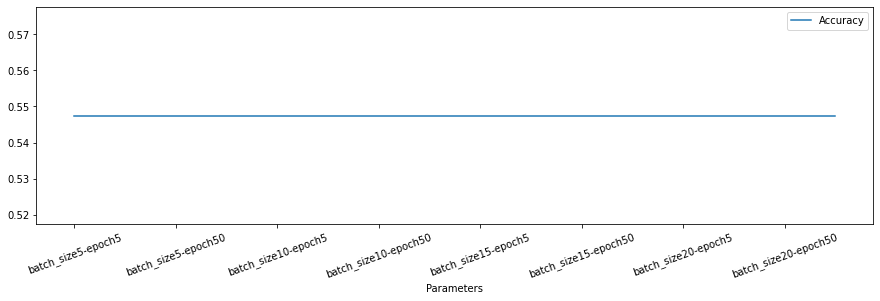

In [ ]:
# Printing the best parameter
print(ResultsData.sort_values(by='Accuracy', ascending=False).head(1))
 
# Visualizing the results
%matplotlib inline
ResultsData.plot(x='Parameters', y='Accuracy', figsize=(15,4), kind='line', rot=20)

#### deskripsi

In [ ]:
description = {'diagnosis': ['normal', 
                             'Ischemic changes (Coronary Artery Disease)',  
                             'Old Anterior Myocardial Infarction',
                             'Old Inferior Myocardial Infarction',
                             'Sinus tachycardy',
                             'Sinus bradycardy',
                             'Ventricular Premature Contraction (PVC)',
                             'Supraventricular Premature Contraction',
                             'Left bundle branch block',
                             'Right bundle branch block',
                             '1. degree AtrioVentricular block',
                             '2. degree AV block',
                             '3. degree AV block',
                             'Left ventricule hypertrophy',
                             'Atrial Fibrillation or Flutter',
                             'Others'], 
               'label': [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]}

desc = pd.DataFrame(description)
desc.head(16)

,diagnosis,label
0,normal,1
1,Ischemic changes (Coronary Artery Disease),2
2,Old Anterior Myocardial Infarction,3
3,Old Inferior Myocardial Infarction,4
4,Sinus tachycardy,5
5,Sinus bradycardy,6
6,Ventricular Premature Contraction (PVC),7
7,Supraventricular Premature Contraction,8
8,Left bundle branch block,9
9,Right bundle branch block,10


In [ ]:
df['diagnosis'].value_counts()

1     245
10     50
2      44
6      25
16     22
3      15
4      15
5      13
9       9
15      5
14      4
7       3
8       2
Name: diagnosis, dtype: int64

- QRS duration = 80 - 120 msec 
- P-R interval = 120 - 200 msec 
- Q-T interval = 350 - 430 msec
- T interval = 120 - 280 msec
- P interval = 80 - 200 msec
- QRS = 40 msec
- T = 40 msec
- P = 50 msec
- QRST = 40 msec
- Heart rate = 60 to 100 beats per minute

## Model 2

In [ ]:
def clas(x):
  if x == 1:
    return 1
  else:
    return 0

In [ ]:
df2 = df
df2['diagnosis'] = df2['diagnosis'].apply(clas)

In [ ]:
df2['diagnosis'].value_counts()

1    245
0    207
Name: diagnosis, dtype: int64

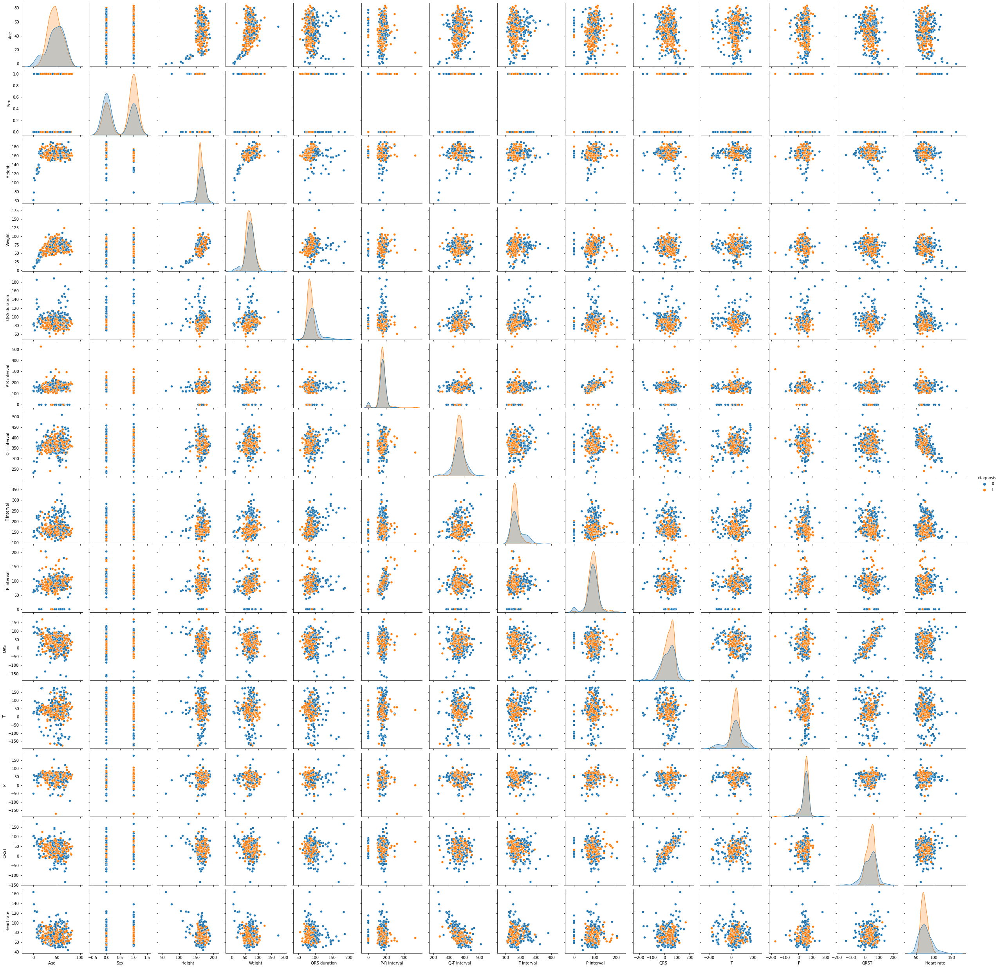

In [ ]:
sns.color_palette("bright")
sns.pairplot(df2, hue='diagnosis')  
plt.show()

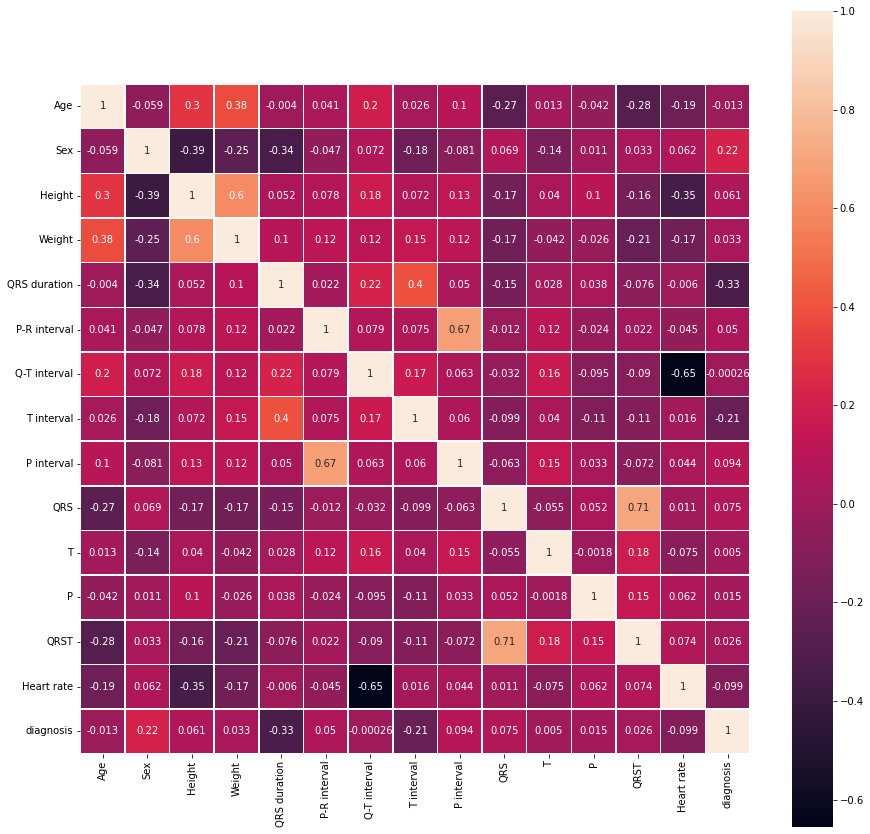

In [ ]:
corrmat = df2.corr() # Correlation matrix.
f, ax = plt.subplots(figsize=(15, 15))
plt.xticks(rotation='90')
sns.heatmap(corrmat, square=True, linewidths=.5, annot=True)
plt.show()

### split data

In [ ]:
#split dataset in features and target variable
X = df2.drop('diagnosis', axis=1, inplace=False) # Features
y = df2.diagnosis # Target variable

In [ ]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1234) # 70% training and 30% test

### Decision Tree

In [ ]:
# Create Decision Tree classifer object
DCT = DecisionTreeClassifier()

# Train Decision Tree Classifer
DCT = DCT.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = DCT.predict(X_test)

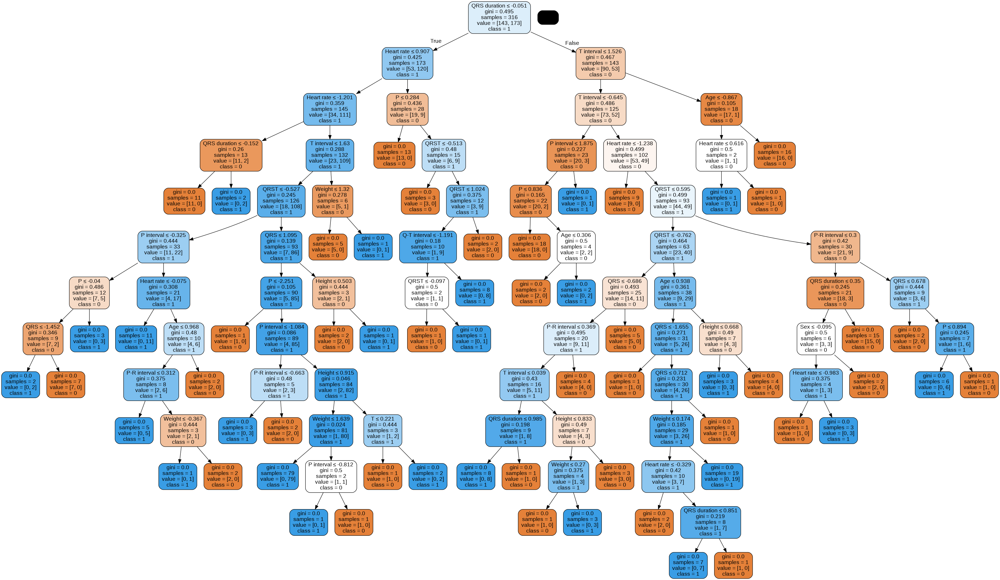

In [ ]:
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names = X.columns,
                class_names= ' '.join(map(str, df['diagnosis'].unique())).split(' '))

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('classification 2.png')
Image(graph.create_png())

In [ ]:
print("Classification Report : \n",classification_report(y_test, y_pred))
print("Accuracy :", round(accuracy_score(y_test, y_pred) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test, y_pred),2))

Classification Report : 
               precision    recall  f1-score   support

           0       0.70      0.77      0.73        64
           1       0.77      0.71      0.74        72

   micro avg       0.74      0.74      0.74       136
   macro avg       0.74      0.74      0.74       136
weighted avg       0.74      0.74      0.74       136

Accuracy : 73.53
Cohen Kappa : 0.47


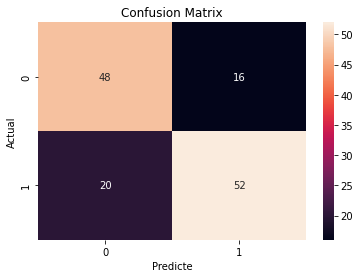

In [ ]:
cm = confusion_matrix(y_test, y_pred)
# print(cm)
sns.heatmap(cm, annot = True)
plt.xlabel("Predicte")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### fine tuning

In [ ]:
params = {'max_leaf_nodes': list(range(2, 100)), 'min_samples_split': list(range(2, 50))}
DCT_gs = grid_search_cv = GridSearchCV(DecisionTreeClassifier(random_state=1234), params, verbose=1, cv=5,  n_jobs=-1)
DCT_gs.fit(X_train,y_train)

Fitting 5 folds for each of 4704 candidates, totalling 23520 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 1936 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 8236 tasks      | elapsed:   36.8s
[Parallel(n_jobs=-1)]: Done 18736 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 23520 out of 23520 | elapsed:  1.4min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=1234,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_leaf_nodes': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 7...25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [ ]:
DCT_gs.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=20,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=27,
            min_weight_fraction_leaf=0.0, presort=False, random_state=1234,
            splitter='best')

In [ ]:
y_pred = DCT_gs.predict(X_test)

In [ ]:
print("Classification Report : \n",classification_report(y_test, y_pred))
print("Accuracy :", round(accuracy_score(y_test, y_pred) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test, y_pred),2))

Classification Report : 
               precision    recall  f1-score   support

           0       0.64      0.67      0.66        64
           1       0.70      0.67      0.68        72

   micro avg       0.67      0.67      0.67       136
   macro avg       0.67      0.67      0.67       136
weighted avg       0.67      0.67      0.67       136

Accuracy : 66.91
Cohen Kappa : 0.34


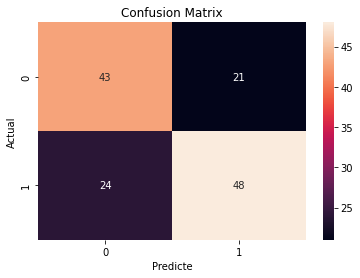

In [ ]:
cm = confusion_matrix(y_test, y_pred)
# print(cm)
sns.heatmap(cm, annot = True)
plt.xlabel("Predicte")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

### K Nearest-neighbor

In [ ]:
from sklearn.preprocessing import StandardScaler  
scaler = StandardScaler()  
scaler.fit(X_train)

X_train = scaler.transform(X_train)  
X_test = scaler.transform(X_test)

In [ ]:
#Import knearest neighbors Classifier model
from sklearn.neighbors import KNeighborsClassifier

#Create KNN Classifier
knn = KNeighborsClassifier(n_neighbors=5)

#Train the model using the training sets
knn.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = knn.predict(X_test)

In [ ]:
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7058823529411765


In [ ]:
print("Classification Report : \n",classification_report(y_test, y_pred))
print("Accuracy :", round(accuracy_score(y_test, y_pred) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test, y_pred),2))

Classification Report : 
               precision    recall  f1-score   support

           0       0.80      0.50      0.62        64
           1       0.67      0.89      0.76        72

   micro avg       0.71      0.71      0.71       136
   macro avg       0.73      0.69      0.69       136
weighted avg       0.73      0.71      0.69       136

Accuracy : 70.59
Cohen Kappa : 0.4


#### fine tuning

In [ ]:
error = []

# Calculating error for K values between 1 and 100
for i in range(1, 40):  
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_test)
    error.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error rata-rata')

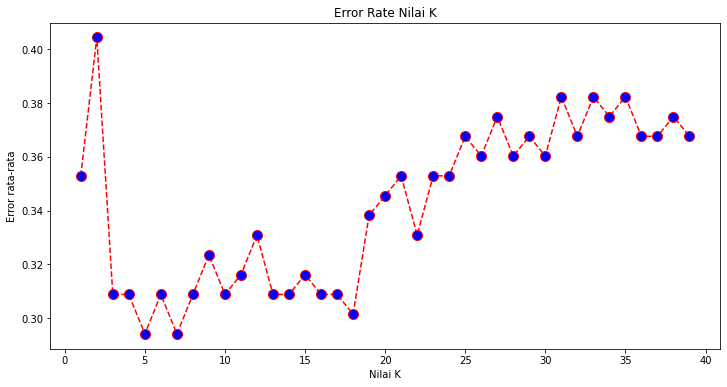

In [ ]:
plt.figure(figsize=(12, 6))  
plt.plot(range(1, 40), error, color='red', linestyle='dashed', marker='o',  
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate Nilai K')  
plt.xlabel('Nilai K')  
plt.ylabel('Error rata-rata')  

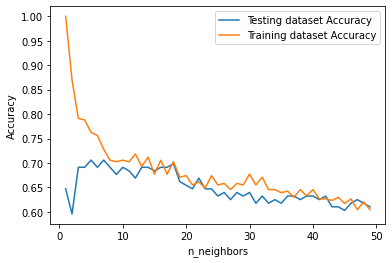

In [ ]:
neighbors = np.arange(1, 50)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
 
# Loop over K values
for i, k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
     
    # Compute training and test data accuracy
    train_accuracy[i] = knn.score(X_train, y_train)
    test_accuracy[i] = knn.score(X_test, y_test)
 
# Generate plot
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy')
 
plt.legend()
plt.xlabel('n_neighbors')
plt.ylabel('Accuracy')
plt.show()

### Naive Bayes

In [ ]:
#Import Gaussian Naive Bayes model
from sklearn.naive_bayes import GaussianNB

#Create a Gaussian Classifier
gnb = GaussianNB()

#Train the model using the training sets
gnb.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = gnb.predict(X_test)

In [ ]:
print("Classification Report : \n",classification_report(y_test, y_pred))
print("Accuracy :", round(accuracy_score(y_test, y_pred) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test, y_pred),2))

Classification Report : 
               precision    recall  f1-score   support

           0       0.79      0.58      0.67        64
           1       0.70      0.86      0.77        72

   micro avg       0.73      0.73      0.73       136
   macro avg       0.74      0.72      0.72       136
weighted avg       0.74      0.73      0.72       136

Accuracy : 72.79
Cohen Kappa : 0.45


#### fine tuning

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold

cv_method = RepeatedStratifiedKFold(n_splits=5, 
                                    n_repeats=3, 
                                    random_state=999)

In [ ]:
from sklearn.preprocessing import PowerTransformer
params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}

gs_NB = GridSearchCV(estimator=gnb, 
                     param_grid=params_NB, 
                     cv=cv_method,
                     verbose=1, 
                     scoring='accuracy')

Data_transformed = PowerTransformer().fit_transform(X_test)

gs_NB.fit(Data_transformed, y_test);

Fitting 15 folds for each of 100 candidates, totalling 1500 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1500 out of 1500 | elapsed:    2.8s finished


In [ ]:
gs_NB.best_params_

{'var_smoothing': 0.2848035868435802}

In [ ]:
gs_NB.best_score_

0.7083333333333334

In [ ]:
y_pred = gs_NB.predict(X_test)

In [ ]:
print("Classification Report : \n",classification_report(y_test, y_pred))
print("Accuracy :", round(accuracy_score(y_test, y_pred) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test, y_pred),2))

Classification Report : 
               precision    recall  f1-score   support

           0       0.86      0.56      0.68        64
           1       0.70      0.92      0.80        72

   micro avg       0.75      0.75      0.75       136
   macro avg       0.78      0.74      0.74       136
weighted avg       0.78      0.75      0.74       136

Accuracy : 75.0
Cohen Kappa : 0.49


### SVM

In [ ]:
#Import svm model
from sklearn import svm
from sklearn.svm import SVC

#Create a svm Classifier
SVM = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
SVM.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = SVM.predict(X_test)

In [ ]:
print("Classification Report : \n",classification_report(y_test, y_pred))
print("Accuracy :", round(accuracy_score(y_test, y_pred) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test, y_pred),2))

Classification Report : 
               precision    recall  f1-score   support

           0       0.73      0.55      0.62        64
           1       0.67      0.82      0.74        72

   micro avg       0.69      0.69      0.69       136
   macro avg       0.70      0.68      0.68       136
weighted avg       0.70      0.69      0.68       136

Accuracy : 69.12
Cohen Kappa : 0.37


#### fine tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
 
# defining parameter range
param_grid = {
    'C' : [1000, 10000, 100000],
    'gamma' : [0.5, 0.05, 0.005],
    'kernel' : ['linear', 'poly', 'rbf', 'sigmoid']
    }
 
grid = GridSearchCV(SVC(), param_grid, refit=True, verbose=3)
 
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 3 folds for each of 36 candidates, totalling 108 fits
[CV] C=1000, gamma=0.5, kernel=linear ................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  C=1000, gamma=0.5, kernel=linear, score=0.6698113207547169, total=   1.0s
[CV] C=1000, gamma=0.5, kernel=linear ................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s remaining:    0.0s


[CV]  C=1000, gamma=0.5, kernel=linear, score=0.7169811320754716, total=   5.7s
[CV] C=1000, gamma=0.5, kernel=linear ................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    6.7s remaining:    0.0s


[CV]  C=1000, gamma=0.5, kernel=linear, score=0.6826923076923077, total=   1.5s
[CV] C=1000, gamma=0.5, kernel=poly ..................................
[CV]  C=1000, gamma=0.5, kernel=poly, score=0.6320754716981132, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=poly ..................................
[CV]  C=1000, gamma=0.5, kernel=poly, score=0.6037735849056604, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=poly ..................................
[CV]  C=1000, gamma=0.5, kernel=poly, score=0.6346153846153846, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=rbf ...................................
[CV]  C=1000, gamma=0.5, kernel=rbf, score=0.6509433962264151, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=rbf ...................................
[CV]  C=1000, gamma=0.5, kernel=rbf, score=0.6698113207547169, total=   0.0s
[CV] C=1000, gamma=0.5, kernel=rbf ...................................
[CV]  C=1000, gamma=0.5, kernel=rbf, score=0.6538461538461539, total=   0.0s
[CV] C=1000, gamma=0.5, kerne

[Parallel(n_jobs=1)]: Done 108 out of 108 | elapsed: 35.5min finished


GridSearchCV(cv='warn', error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [1000, 10000, 100000], 'gamma': [0.5, 0.05, 0.005], 'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=3)

In [ ]:
# print best parameter after tuning
print(grid.best_params_)
 
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 100000, 'gamma': 0.5, 'kernel': 'linear'}
SVC(C=100000, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.5, kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)


In [ ]:
y_pred = grid.predict(X_test)
 
# print classification report

print("Classification Report : \n",classification_report(y_test, y_pred))
print("Accuracy :", round(accuracy_score(y_test, y_pred) * 100,2))
print("Cohen Kappa :", round(cohen_kappa_score(y_test, y_pred),2))

Classification Report : 
               precision    recall  f1-score   support

           0       0.72      0.59      0.65        64
           1       0.69      0.79      0.74        72

   micro avg       0.70      0.70      0.70       136
   macro avg       0.70      0.69      0.69       136
weighted avg       0.70      0.70      0.70       136

Accuracy : 69.85
Cohen Kappa : 0.39


### Deep Learning

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

In [ ]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(units=12, input_dim=14, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=10, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=8, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=6, kernel_initializer='uniform', activation='relu'),
  tf.keras.layers.Dense(units=1, kernel_initializer='uniform', activation='sigmoid') 
])

In [ ]:
model.summary()

# compile model dengan 'adam' optimizer loss function 'binary_crossentropy'
model.compile(optimizer=tf.optimizers.Adam(), 
              loss='binary_crossentropy', 
              metrics=['accuracy'])

Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_236 (Dense)           (None, 12)                180       
                                                                 
 dense_237 (Dense)           (None, 10)                130       
                                                                 
 dense_238 (Dense)           (None, 8)                 88        
                                                                 
 dense_239 (Dense)           (None, 6)                 54        
                                                                 
 dense_240 (Dense)           (None, 1)                 7         
                                                                 
Total params: 459
Trainable params: 459
Non-trainable params: 0
_________________________________________________________________


In [ ]:
classifier = Sequential()
classifier.add(Dense(units=12, input_dim=14, kernel_initializer='uniform', activation='relu'))
classifier.add(Dense(units=10, kernel_initializer='uniform', activation='relu'))
classifier.add(Dense(units=8, kernel_initializer='uniform', activation='relu'))
classifier.add(Dense(units=6, kernel_initializer='uniform', activation='relu'))

# for Multiclass classification the activation ='softmax'
classifier.add(Dense(units=1, kernel_initializer='uniform', activation='sigmoid'))

# Optimizer== the algorithm of SGG to keep updating weights
# loss== the loss function to measure the accuracy
# metrics== the way we will compare the accuracy after each step of SGD
classifier.compile(optimizer=tf.optimizers.Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# fitting the Neural Network on the training data
survivalANN_Model=classifier.fit(X_train,y_train, batch_size=10 , epochs=10, verbose=1)

Epoch 1/10
32/32 [==============================] - 1s 2ms/step - loss: 0.6929 - accuracy: 0.5380
Epoch 2/10
32/32 [==============================] - 0s 2ms/step - loss: 0.6925 - accuracy: 0.5475
Epoch 3/10
32/32 [==============================] - 0s 2ms/step - loss: 0.6921 - accuracy: 0.5475
Epoch 4/10
32/32 [==============================] - 0s 2ms/step - loss: 0.6912 - accuracy: 0.5475
Epoch 5/10
32/32 [==============================] - 0s 2ms/step - loss: 0.6878 - accuracy: 0.5475
Epoch 6/10
32/32 [==============================] - 0s 2ms/step - loss: 0.6757 - accuracy: 0.5475
Epoch 7/10
32/32 [==============================] - 0s 2ms/step - loss: 0.6510 - accuracy: 0.5696
Epoch 8/10
32/32 [==============================] - 0s 2ms/step - loss: 0.6180 - accuracy: 0.7342
Epoch 9/10
32/32 [==============================] - 0s 2ms/step - loss: 0.5912 - accuracy: 0.7627
Epoch 10/10
32/32 [==============================] - 0s 2ms/step - loss: 0.5603 - accuracy: 0.7722


#### fine tuning

In [ ]:
# Defining a function for finding best hyperparameters
def FunctionFindBestParams(X_train, y_train):
    
    # Defining the list of hyper parameters to try
    TrialNumber=0
    batch_size_list=[5, 10, 15, 20]
    epoch_list=[5, 10, 50 ,100]
    
    import pandas as pd
    SearchResultsData=pd.DataFrame(columns=['TrialNumber', 'Parameters', 'Accuracy'])
    
    for batch_size_trial in batch_size_list:
        for epochs_trial in epoch_list:
            TrialNumber+=1
            
            # Creating the classifier ANN model
            classifier = Sequential()
            classifier.add(Dense(units=14, input_dim=14, kernel_initializer='uniform', activation='relu'))
            classifier.add(Dense(units=12, kernel_initializer='uniform', activation='relu'))
            classifier.add(Dense(units=10, kernel_initializer='uniform', activation='relu'))
            classifier.add(Dense(units=8, kernel_initializer='uniform', activation='relu'))
            classifier.add(Dense(units=6, kernel_initializer='uniform', activation='relu'))
            classifier.add(Dense(units=1, kernel_initializer='uniform', activation='sigmoid'))
            classifier.compile(optimizer=tf.optimizers.Adam(), loss='binary_crossentropy', metrics=['accuracy'])
 
            
            survivalANN_Model=classifier.fit(X_train,y_train, batch_size=batch_size_trial , epochs=epochs_trial, verbose=0)
            # Fetching the accuracy of the training
            Accuracy = survivalANN_Model.history['accuracy'][-1]
            
            # printing the results of the current iteration
            print(TrialNumber, 'Parameters:','batch_size:', batch_size_trial,'-', 'epochs:',epochs_trial, 'Accuracy:', Accuracy)
            
            SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[TrialNumber,
                            'batch_size'+str(batch_size_trial)+'-'+'epoch'+str(epochs_trial), Accuracy]],
                                                                    columns=['TrialNumber', 'Parameters', 'Accuracy'] ))
    return(SearchResultsData)
 
###############################################

# Calling the function
ResultsData=FunctionFindBestParams(X_train, y_train)

1 Parameters: batch_size: 5 - epochs: 5 Accuracy: 0.5443037748336792
2 Parameters: batch_size: 5 - epochs: 10 Accuracy: 0.547468364238739
3 Parameters: batch_size: 5 - epochs: 50 Accuracy: 0.9018987417221069
4 Parameters: batch_size: 5 - epochs: 100 Accuracy: 0.9303797483444214
5 Parameters: batch_size: 10 - epochs: 5 Accuracy: 0.547468364238739
6 Parameters: batch_size: 10 - epochs: 10 Accuracy: 0.547468364238739
7 Parameters: batch_size: 10 - epochs: 50 Accuracy: 0.547468364238739
8 Parameters: batch_size: 10 - epochs: 100 Accuracy: 0.9303797483444214
9 Parameters: batch_size: 15 - epochs: 5 Accuracy: 0.547468364238739
10 Parameters: batch_size: 15 - epochs: 10 Accuracy: 0.547468364238739
11 Parameters: batch_size: 15 - epochs: 50 Accuracy: 0.8544303774833679
12 Parameters: batch_size: 15 - epochs: 100 Accuracy: 0.547468364238739
13 Parameters: batch_size: 20 - epochs: 5 Accuracy: 0.547468364238739
14 Parameters: batch_size: 20 - epochs: 10 Accuracy: 0.547468364238739
15 Parameters: 

  TrialNumber            Parameters  Accuracy
0           4  batch_size5-epoch100   0.93038


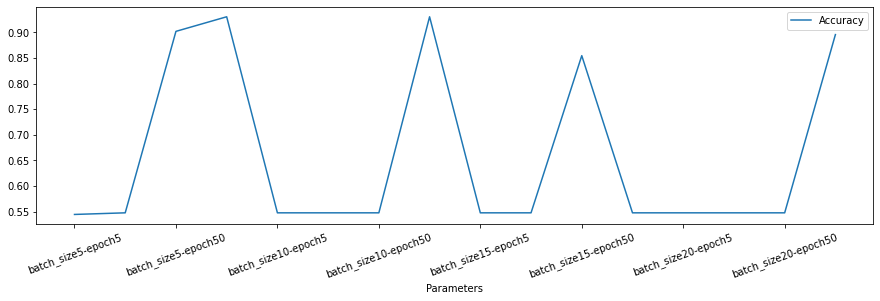

In [ ]:
# Printing the best parameter
print(ResultsData.sort_values(by='Accuracy', ascending=False).head(1))
 
# Visualizing the results
%matplotlib inline
ResultsData.plot(x='Parameters', y='Accuracy', figsize=(15,4), kind='line', rot=20)

In [ ]:
# Training the model with best hyperparamters
classifier.fit(X_train,y_train, batch_size=20 , epochs=100, verbose=1)

Epoch 1/100
16/16 [==============================] - 0s 3ms/step - loss: 0.2657 - accuracy: 0.9241
Epoch 2/100
16/16 [==============================] - 0s 2ms/step - loss: 0.2656 - accuracy: 0.9272
Epoch 3/100
16/16 [==============================] - 0s 3ms/step - loss: 0.2611 - accuracy: 0.9241
Epoch 4/100
16/16 [==============================] - 0s 4ms/step - loss: 0.2608 - accuracy: 0.9272
Epoch 5/100
16/16 [==============================] - 0s 4ms/step - loss: 0.2580 - accuracy: 0.9272
Epoch 6/100
16/16 [==============================] - 0s 5ms/step - loss: 0.2569 - accuracy: 0.9272
Epoch 7/100
16/16 [==============================] - 0s 4ms/step - loss: 0.2576 - accuracy: 0.9272
Epoch 8/100
16/16 [==============================] - 0s 3ms/step - loss: 0.2567 - accuracy: 0.9304
Epoch 9/100
16/16 [==============================] - 0s 3ms/step - loss: 0.2561 - accuracy: 0.9304
Epoch 10/100
16/16 [==============================] - 0s 3ms/step - loss: 0.2591 - accuracy: 0.9272
Epoch 11/

In [ ]:
df2[df2['diagnosis']==1].head(5)

,Age,Sex,Height,Weight,QRS duration,P-R interval,Q-T interval,T interval,P interval,QRS,T,P,QRST,Heart rate,diagnosis
3,55,0,175,94,100,202,380,179,143,28,11,-5,20,71,1
6,40,1,160,52,77,129,377,133,77,77,49,75,65,70,1
7,49,1,162,54,78,0,376,157,70,67,7,8,51,67,1
8,44,0,168,56,84,118,354,160,63,61,69,78,66,64,1
11,45,1,165,86,77,143,373,150,65,12,37,49,26,72,1


In [ ]:
data_test = [[54, 0, 172, 95, 138, 163, 386, 185, 102, 96, 34, 70, 66, 75]]
print((gs_NB_model_1.predict(data_test)[0]))

data_test = np.array([[44, 0, 168, 56, 84, 118, 354, 160, 63, 61, 69, 78, 66, 64]])
print((gs_NB_model_1.predict(data_test)[0]))


2
2
